In [1]:
import pandas as pd
pd.__version__

'1.5.2'

**一、基础设施REITs基金**

In [2]:
reits_id = {'180101':'招商蛇口产园REIT',
            '180102':'华夏合肥高新REIT',
            '180103':'华夏和达高科REIT',
            '180201':'平安广州广河REIT',
            '180202':'华夏越秀高速REIT',
            '180301':'红土创新盐田港REIT',
            '180401':'鹏华深圳能源REIT',
            '180501':'红土创新深圳安居REIT',
            '180801':'中航首钢绿能REIT',
            '508000':'华安张江光大REIT',
            '508001':'浙江沪杭甬REIT',
            '508006':'富国首创水务REIT',
            '508008':'国金中国铁建REIT',
            '508009':'中金安徽交控REIT',
            '508018':'华夏中国交建REIT',
            '508021':'国君临港产园REIT',
            '508027':'东吴苏园产业REIT',
            '508056':'中金普洛斯REIT',
            '508058':'中金厦门安居REIT',
            '508066':'华泰江苏交控REIT',
            '508068':'华夏北京保障房REIT',
            '508077':'华夏华润有巢REIT',
            '508088':'国君东久新经济REIT',
            '508099':'建信中关村REIT',
            '508098':'嘉实京东仓储REIT'}
type(reits_id)

dict

In [3]:
reits_id.__len__()

25

In [4]:
benchmark_id = {'399300':'沪深300指数',
                '000852':'中证1000指数',
                'H11001':'中证全债指数',
                'H11006':'中证国债指数',
                '932006':'中证REITs全收益指数'}
type(benchmark_id)

dict

In [5]:
benchmark_id.__len__()

5

**二、导入基础设施公募REITs及业绩比较基准的历史行情数据**

**（1）导入基础设施公募日儿童历史行情数据**

In [6]:
reits_value = dict()
i = 0
for k in reits_id.keys():
    reits_value[k] = pd.read_excel('data/基础设施公募REITs历史行情数据-数据导入表（勿动）.xlsx',
                                   sheet_name= i,
                                   header=2,
                                   index_col='日期')
    i = i + 1

reits_value.keys()

dict_keys(['180101', '180102', '180103', '180201', '180202', '180301', '180401', '180501', '180801', '508000', '508001', '508006', '508008', '508009', '508018', '508021', '508027', '508056', '508058', '508066', '508068', '508077', '508088', '508099', '508098'])

In [7]:
reits_value.__len__()

25

**（2）导入业绩比较基准数据**

In [8]:
benchmark_value = dict()
i = 0
for k in benchmark_id.keys():
    benchmark_value[k] = pd.read_excel('data/业绩比较基准数据.xlsx',
                                   sheet_name= i,
                                   header=2,
                                   index_col='日期')
    i = i + 1

benchmark_value.keys()

dict_keys(['399300', '000852', 'H11001', 'H11006', '932006'])

In [9]:
benchmark_value.__len__()

5

**三、绘制基础设施公募REITs历史行情图**

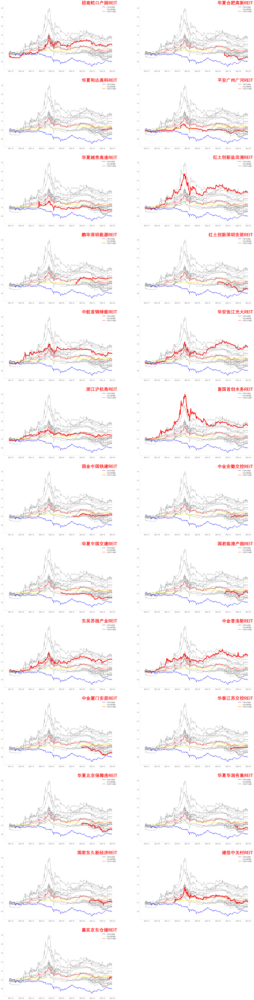

In [10]:
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams['font.family'] = 'Dengxian'
plt.rcParams['axes.unicode_minus'] = False

COLORS = ['red','gray']
LINES = [4,1]

fig, axs = plt.subplots(13,2, figsize=(30,120))
for i, v in zip(range(25),reits_id.keys()):
    r = int(i/2)
    c = int(i % 2)
    for k in reits_value.keys():
        if k == v:
            col = COLORS[0]
            l = LINES[0]
        else:
            col = COLORS[1]
            l = LINES[1]

        x = reits_value[k].index
        y = reits_value[k]['收盘价']/reits_value[k]['收盘价'][0]
        axs[r,c].plot(x,y,color=col,linewidth=l)

    # 添加业绩比较基准
    # '399300':'沪深300指数',
    # '000852':'中证1000指数',
    # 'H11001':'中证全债指数',
    # 'H11006':'中证国债指数',
    # '932006':'中证REITs全收益指数'

    # 添加沪深300指数,
    symbol = '399300'
    col = 'blue'
    label = '沪深300指数'
    x_benchmark = benchmark_value[symbol].index
    y_benchmark = benchmark_value[symbol]['收盘价']/benchmark_value[symbol]['收盘价'][0]
    axs[r,c].plot(x_benchmark,y_benchmark,color=col,label=label)

    # 添加中证全债指数
    symbol = 'H11001'
    col = 'yellow'
    label = '中证全债指数'
    x_benchmark = benchmark_value[symbol].index
    y_benchmark = benchmark_value[symbol]['收盘价']/benchmark_value[symbol]['收盘价'][0]
    axs[r,c].plot(x_benchmark,y_benchmark,color=col,label=label)

    # 添加中证REITs全收益指数
    symbol = '932006'
    col = 'red'
    label = '中证REITs指数'
    x_benchmark = benchmark_value[symbol].index
    y_benchmark = benchmark_value[symbol]['收盘价']/benchmark_value[symbol]['收盘价'][0]
    axs[r,c].plot(x_benchmark,y_benchmark,color=col,label=label)

    axs[r,c].set_title(reits_id[v],loc='right',fontdict={'fontsize':30,'fontweight':'bold','color':'red'})
    axs[r,c].grid(False)
    axs[r,c].legend(loc='best',edgecolor='white',ncols=1)
    axs[r,c].spines['top'].set_color('None')
    axs[r,c].spines['right'].set_color('None')

axs[12,1].set_axis_off()

**四、基础设施公募REITs历史滚动波动率**

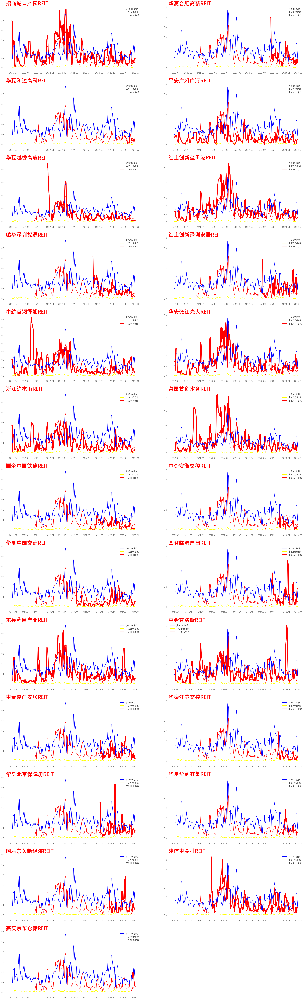

In [11]:
import quantstats as qs

import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.rcParams['font.family'] = 'Dengxian'
plt.rcParams['axes.unicode_minus'] = False

fig,axs = plt.subplots(13,2, figsize=(30,100))

rp = 5

for i , k in zip(range(25), reits_id.keys()):

    row = int(i / 2)
    col = int(i % 2)

    returns_label = k
    returns = qs.stats.rolling_volatility(reits_value[k]['收盘价'],
                                          rolling_period=rp)

    df = pd.DataFrame(index=returns.index,
                      data={returns_label:returns})
    axs[row,col].plot(df[returns_label],
                      color='red',
                      linewidth=5)

    # 添加沪深300指数的波动率
    symbol = '399300'
    color = 'blue'
    label = '沪深300指数'
    benchmark = qs.stats.rolling_volatility(benchmark_value[symbol]['收盘价'],
                                            rolling_period=rp)
    df_bm = pd.DataFrame(index=benchmark.index,
                         data={label:benchmark})
    axs[row,col].plot(df_bm[label],color=color,label=label)

    # 添加中证全债指数的波动率
    symbol = 'H11001'
    color = 'yellow'
    label = '中证全债指数'
    benchmark = qs.stats.rolling_volatility(benchmark_value[symbol]['收盘价'],
                                            rolling_period=rp)
    df_bm = pd.DataFrame(index=benchmark.index,
                         data={label:benchmark})
    axs[row,col].plot(df_bm[label],color=color,label=label)

    # 添加中证REITs全收益指数
    symbol = '932006'
    color = 'red'
    label = '中证REITs指数'
    benchmark = qs.stats.rolling_volatility(benchmark_value[symbol]['收盘价'],
                                            rolling_period=rp)
    df_bm = pd.DataFrame(index=benchmark.index,
                         data={label:benchmark})
    axs[row,col].plot(df_bm[label],color=color,label=label)

    axs[row,col].set_title(reits_id[k],loc='left',fontdict={'fontsize':30,'fontweight':'bold','color':'red'})
    axs[row,col].grid(False)
    axs[row,col].legend(loc='best',edgecolor='white',ncols=1)
    axs[row,col].spines['top'].set_color('None')
    axs[row,col].spines['right'].set_color('None')

axs[12,1].set_axis_off()

**五、构建REITs基金累计净值数据集**

In [12]:
rdata = pd.DataFrame()
rdata1 = pd.DataFrame()
rdata2 = pd.DataFrame()

In [13]:
for k in benchmark_value.keys():
    rdata1 = pd.concat([rdata1,benchmark_value[k]['收盘价']],axis=1)
rdata1.columns = list(benchmark_id.values())

In [14]:
for k in reits_value.keys():
    rdata2 = pd.concat([rdata2,reits_value[k]['收盘价']], axis=1)
rdata2.columns = list(reits_id.values())

In [15]:
rdata = rdata1.merge(rdata2,left_index=True,right_index=True)
rdata

,沪深300指数,中证1000指数,中证全债指数,中证国债指数,中证REITs全收益指数,招商蛇口产园REIT,华夏合肥高新REIT,华夏和达高科REIT,平安广州广河REIT,华夏越秀高速REIT,...,国君临港产园REIT,东吴苏园产业REIT,中金普洛斯REIT,中金厦门安居REIT,华泰江苏交控REIT,华夏北京保障房REIT,华夏华润有巢REIT,国君东久新经济REIT,建信中关村REIT,嘉实京东仓储REIT
2021-06-21,5090.3854,6968.2963,210.2690,197.9435,NaN,2.650000,NaN,NaN,13.108000,NaN,...,NaN,3.907000,3.972000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-06-22,5122.1583,7000.2518,210.3028,198.0564,NaN,2.464000,NaN,NaN,13.050000,NaN,...,NaN,3.907000,3.894000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-06-23,5147.3938,7046.1745,210.3815,198.1941,NaN,2.393000,NaN,NaN,13.026000,NaN,...,NaN,3.906000,3.911000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-06-24,5155.9738,6974.6420,210.4756,198.2761,NaN,2.400000,NaN,NaN,12.963000,NaN,...,NaN,3.885000,3.901000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-06-25,5239.9684,7000.4297,210.5398,198.2889,NaN,2.407000,NaN,NaN,13.045000,NaN,...,NaN,3.887000,3.909000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-21,4144.3536,6990.4751,225.9479,212.6130,1067.0611,3.178936,2.584,3.161,12.707250,8.207139,...,5.681,4.934699,5.445196,3.017,7.753,3.007,2.678,3.930,4.317981,4.169
2023-02-22,4106.9506,6998.4298,226.0244,212.7187,1065.0384,3.166470,2.577,3.163,12.708337,8.202948,...,5.648,4.928566,5.400546,3.009,7.774,3.002,2.675,3.905,4.314948,4.162
2023-02-23,4103.6463,6966.7866,226.0254,212.7369,1060.7081,3.137381,2.559,3.152,12.638791,8.192472,...,5.561,4.918345,5.381855,2.999,7.773,2.999,2.667,3.885,4.293717,4.154
2023-02-24,4061.0457,6944.8240,226.0045,212.7280,1054.6912,3.122837,2.545,3.134,12.559466,8.175710,...,5.431,4.890748,5.337206,2.994,7.761,2.970,2.650,3.878,4.262376,4.140


**六、大类资产相关性**

In [16]:
import riskfolio as rp
rp.__version__

'3.3.0'

C:\Users\ThinkPad\.conda\envs\qtconda\lib\site-packages\riskfolio\PlotFunctions.py:2256: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


<Axes: title={'center': 'Assets Clustermap'}>

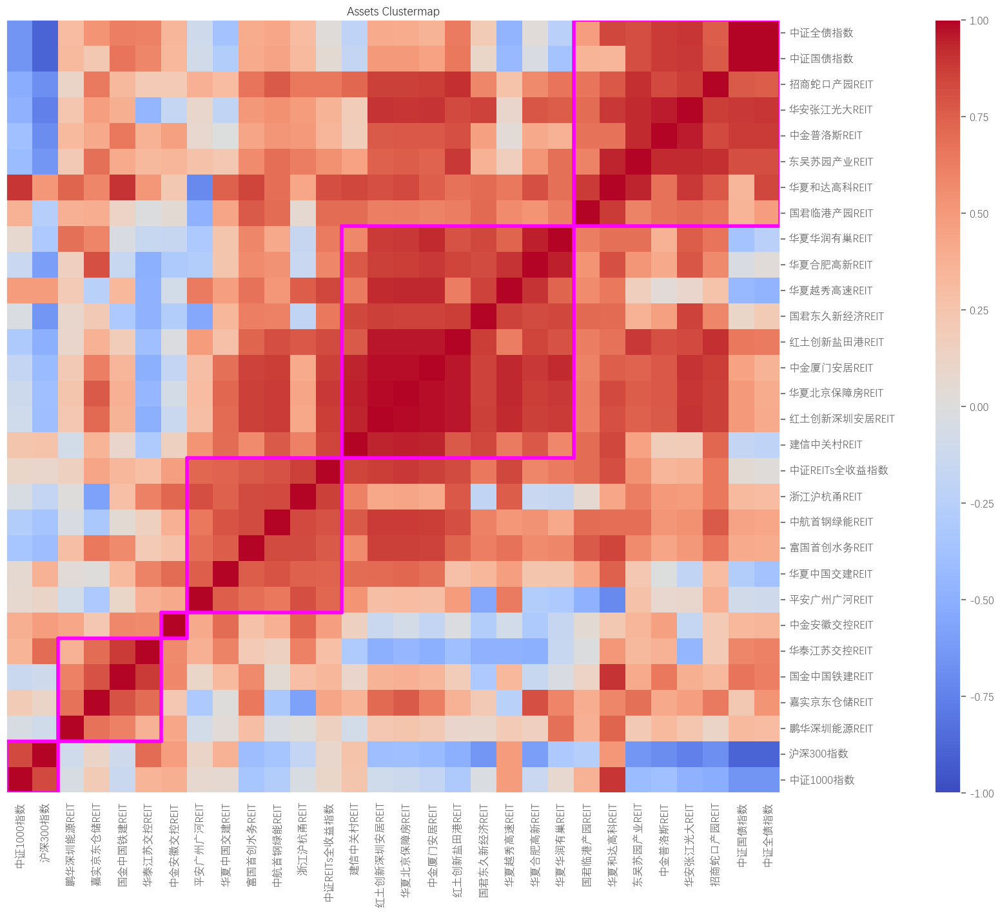

In [17]:
import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.rcParams['font.family'] = 'Dengxian'
plt.rcParams['axes.unicode_minus'] = False

rp.plot_clusters(returns=rdata,
                 codependence='spearman',
                 linkage='ward',
                 k=None,
                 max_k=10,
                 leaf_order=True,
                 dendrogram=False,
                 cmap='coolwarm',
                 title='Assets Clustermap',
                 height=20,
                 width=20,
                 ax=None)

**七、大类资产的相关性表现**

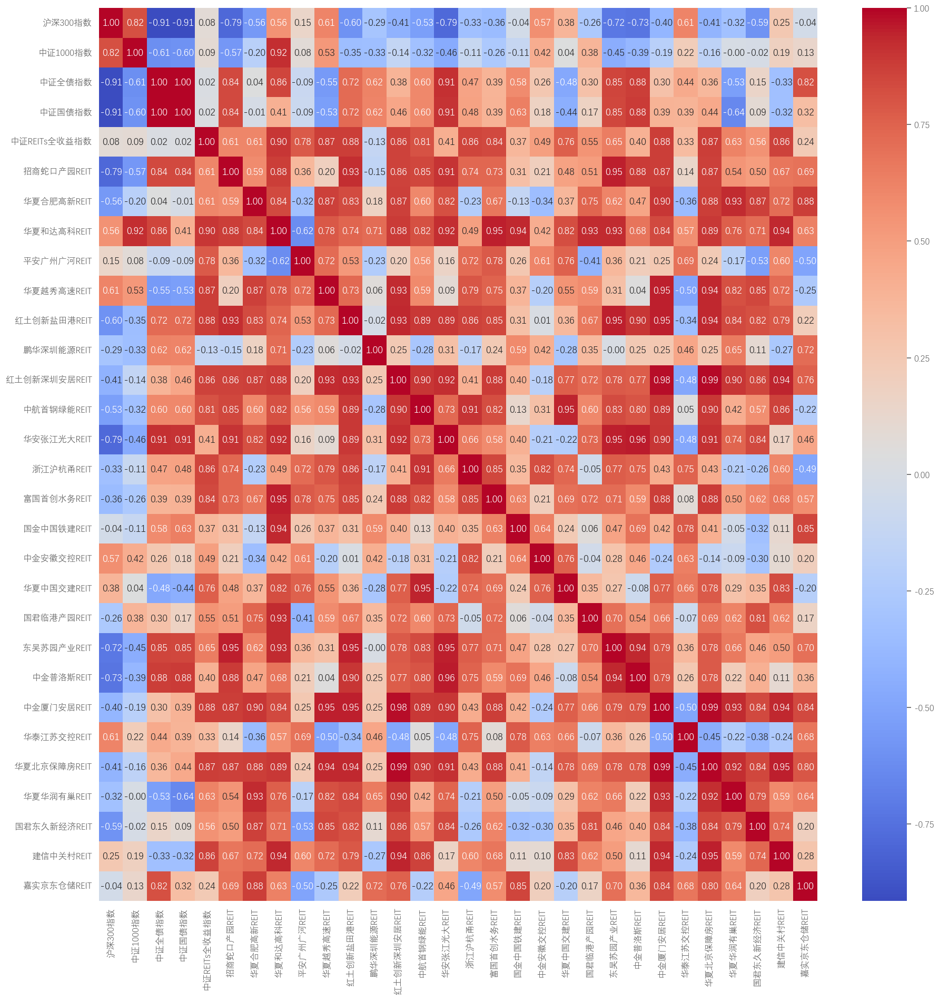

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.rcParams['font.family'] = 'Dengxian'
plt.rcParams['axes.unicode_minus'] = False

# Calculate the correlation matrix
corr = rdata.corr()

# Generate a heatmap of the correlation matrix
plt.figure(figsize=(22,22))
sns.heatmap(corr, annot=True, cmap='coolwarm',fmt=".2f")

# Show the plot
plt.show()